In [2]:
import scipy.io.wavfile
import numpy as np
import matplotlib.pyplot as plt
import scipy.signal as ss
from matplotlib.colors import LogNorm

In [3]:
files = ["Rupert_Blaise_-_06_-_What_A_Wonderful_World.wav","Candy_Dulfer_-_Lily_Was_Here.wav"]
path = '/home/beatka/Downloads/'
Fs1 , signal1 = scipy.io.wavfile.read(path+files[0])
Fs2 , signal2 = scipy.io.wavfile.read(path+files[1])

/home/beatka/.local/lib/python3.7/site-packages/scipy/io/wavfile.py:273: WavFileWarning: Chunk (non-data) not understood, skipping it.
  WavFileWarning)


In [4]:
def spectrogram(syg,Fs,N_okna,N_wsp,okno='hamming',color = 'jet',t_min=None,t_max=None,f_min=None,f_max=None):
    if t_min == None and t_max == None:
        t_min,t_max = 0 , len(syg)/Fs
    if f_min == None and f_max == None:
        f_min , f_max = 0.1 , int(Fs/2)
    F,sig_perio = ss.periodogram(syg,Fs)
    N_okienek = len(syg)/N_okna #obliczanie liczby okienek
    if N_okienek%1 != 0: #aby była poprawna liczba w przypadku float
        N_okienek = int(N_okienek)+1
    N_okienek = int(N_okienek)
    sig_cut = np.zeros((N_okienek,N_okna+N_wsp)) #miejsce na pocięte fragmenty
    for i in range(N_okienek): # cięcie
        if i == N_okienek-1:
            sig_cut[i,:len(syg[i*N_okna:])] = syg[i*N_okna:]
        else:
            sig_cut[i,:] = syg[i*N_okna:(i+1)*N_okna+N_wsp]
    #periodogram na każdym fragmencie
    f_cut , perio_cut = ss.periodogram(sig_cut, Fs, window=okno,axis=1)
    widmo_cale = np.sum(perio_cut,axis = 0)#widmo całego sygnału - suma po osi czestości spektrogramu
    moc_czas = np.sum(perio_cut,axis = 1)#moc sygnalu w czasie = suma po osi czasu spektrogramu
    periodogram = perio_cut.T[::-1,:]#rysowanie w imshow - macierz ma inaczej zorientowany punkt 0,0 niz imshow 
    f_cale = np.linspace(0,f_cut[-1],len(widmo_cale))#oś częstości dla widma
    #rysowanie
    fig = plt.figure(figsize=(18,15),constrained_layout = True)
    gs = fig.add_gridspec(5,6)
    
    fig.add_subplot(gs[:-1,:-1])
    plt.ylabel("Częstość [Hz]")
    plt.yscale('log') #skala logarytmiczna częstości
    plt.xlim(t_min,t_max)
    plt.ylim(f_min,f_max)
    plt.imshow(periodogram, aspect='auto',norm=LogNorm(),extent = (0,len(syg)/Fs,0,f_cut[-1]),cmap = color)
    
    fig.add_subplot(gs[:-1,-1]) 
    plt.xlabel("Moc")
    plt.yscale('log')
    plt.ylim(f_min,f_max)
    plt.plot(widmo_cale,f_cale)
#     plt.plot(sig_perio,F)

    fig.add_subplot(gs[-1,:-1]) 
    plt.xlim(t_min,t_max)
    plt.xlabel("Czas [s]")
    plt.ylabel("Moc")
    plt.plot(np.linspace(0,len(syg)/Fs,len(moc_czas)),moc_czas)
    plt.show()

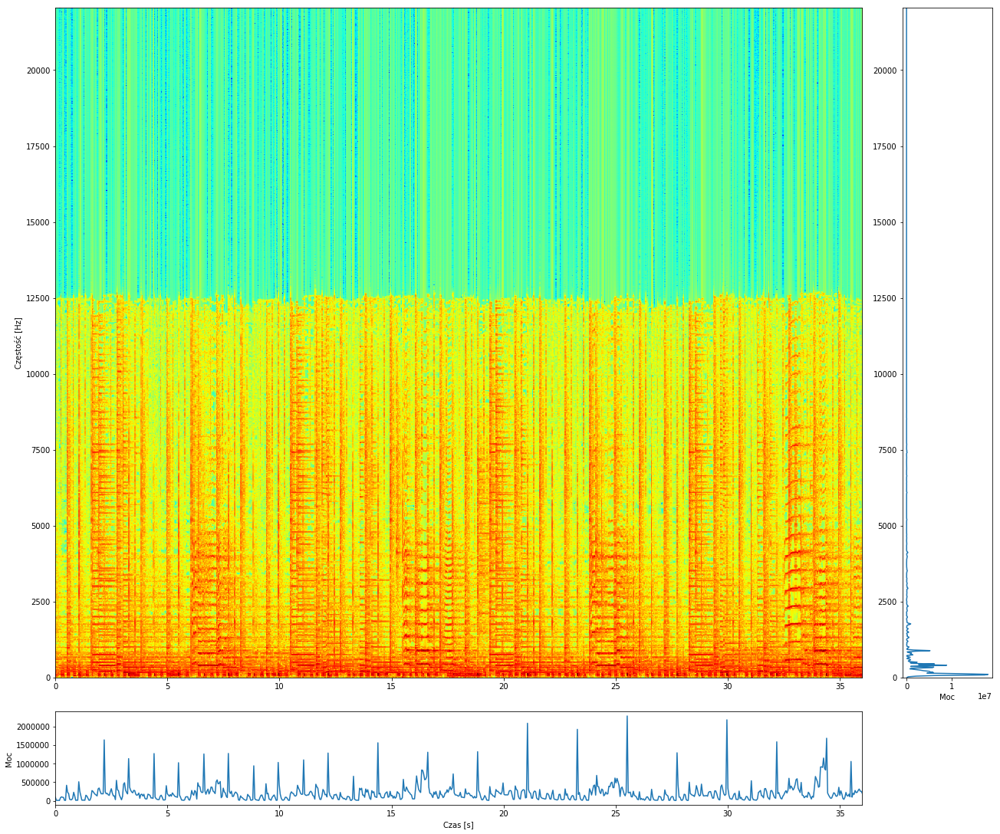

In [5]:
windows = ['boxcar','triang','blackman','hamming','hann','bartlett','flattop','parzen','bohman','blackmanharris','nuttall','barthann']
colors = ['viridis' , 'plasma','inferno','magma','cividis','jet','cubehelix','winter']
spectrogram(signal2,Fs2,2000,200)#,f_min = 170,f_max=int(Fs3/2))

Utwór: 'What a wonderful world'

Długość okna: 512

Liczba próbek wspólnych: 64

okno: hamming

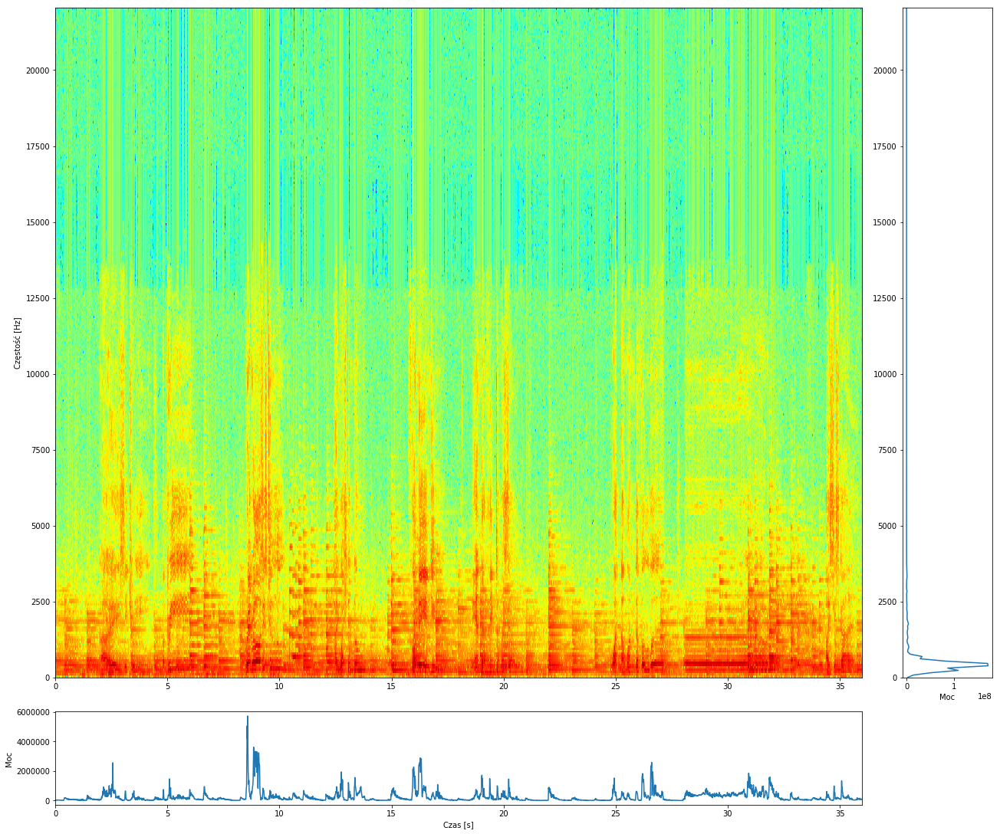

In [6]:
spectrogram(signal1,Fs1,N_okna=512,N_wsp=64)

Utwór: 'What a wonderful world'

Długość okna: 1024

Liczba próbek wspólnych: 128

okno: hamming

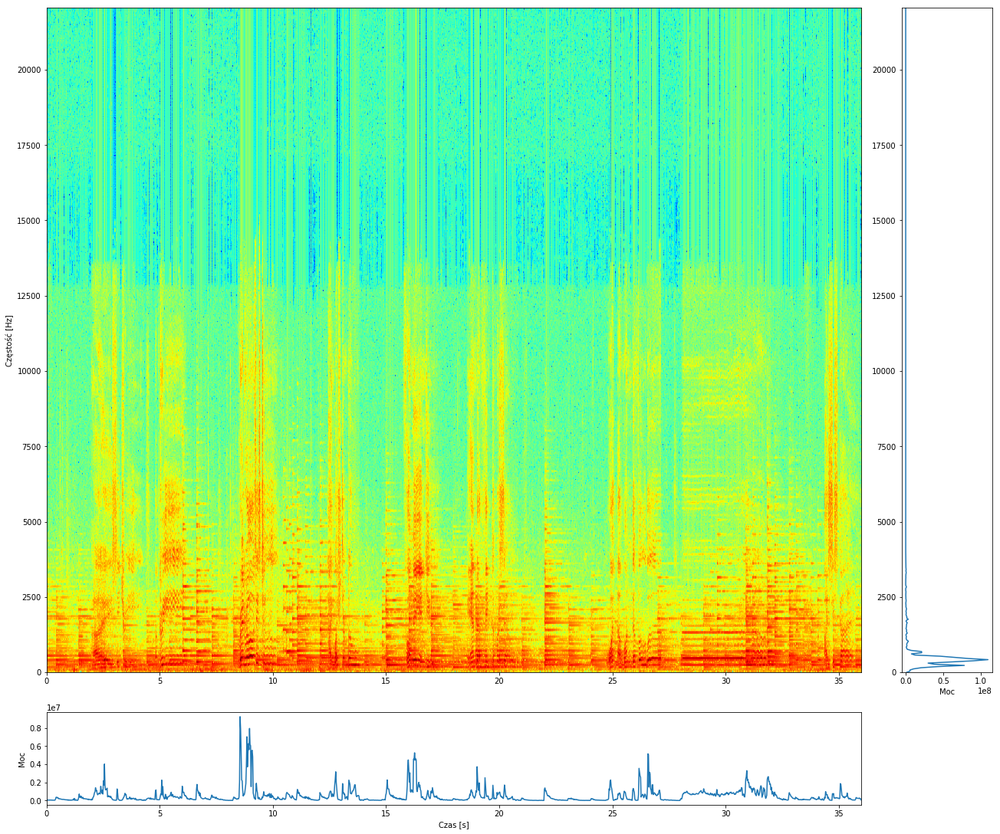

In [7]:
spectrogram(signal1,Fs1,N_okna=1024,N_wsp=128)

Utwór: 'What a wonderful world'

Długość okna: 2048

Liczba próbek wspólnych: 256

okno: hamming

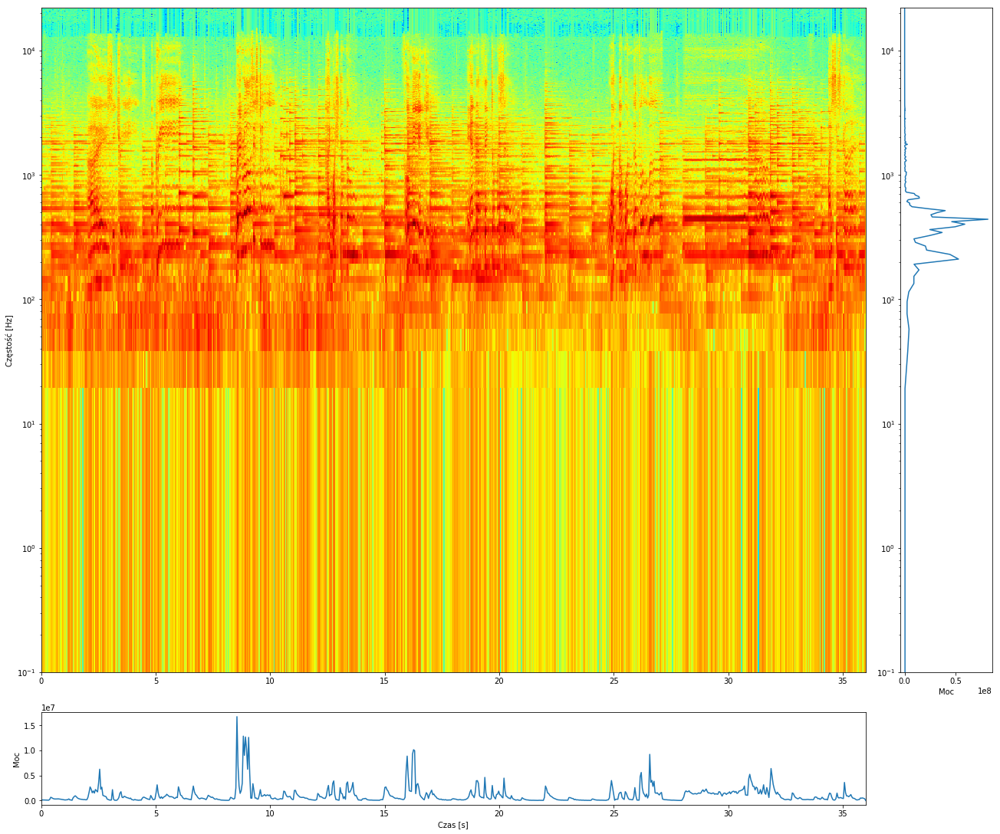

In [130]:
spectrogram(signal1,Fs1,N_okna=2048,N_wsp=256)

Utwór: 'What a wonderful world'

Długość okna: 4096

Liczba próbek wspólnych: 512

okno: hamming

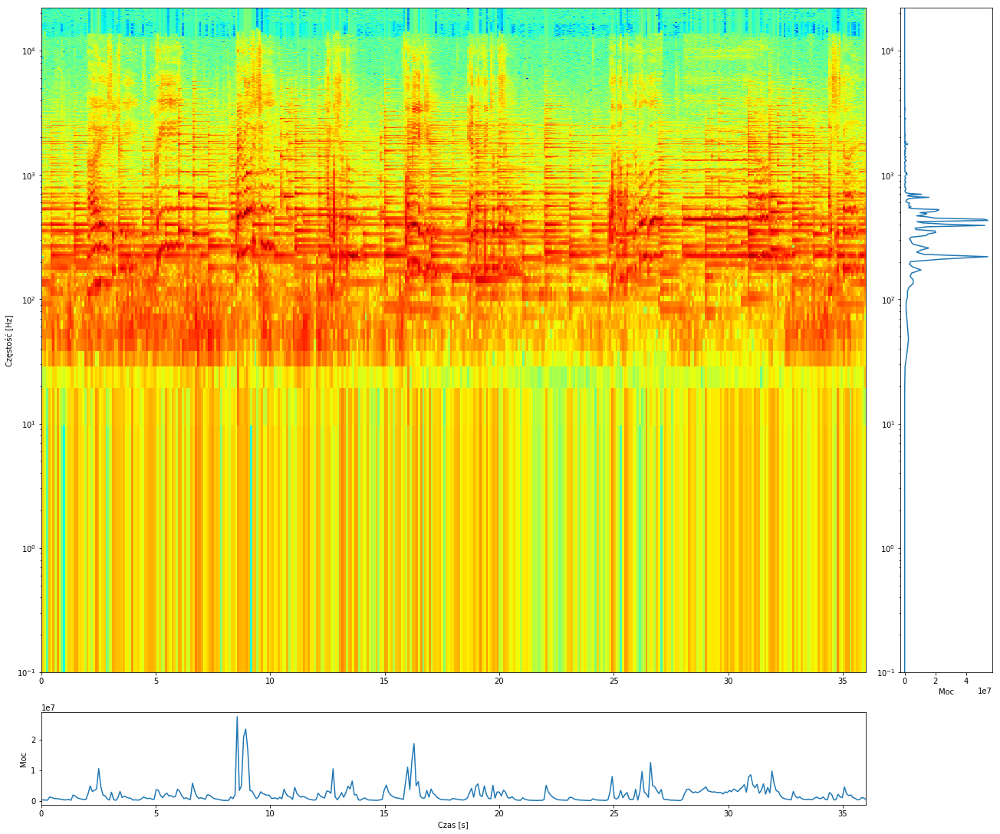

In [131]:
spectrogram(signal1,Fs1,N_okna=4096,N_wsp=512)

Utwór: 'What a wonderful world'

Długość okna: 8192

Liczba próbek wspólnych: 1024

okno: hamming

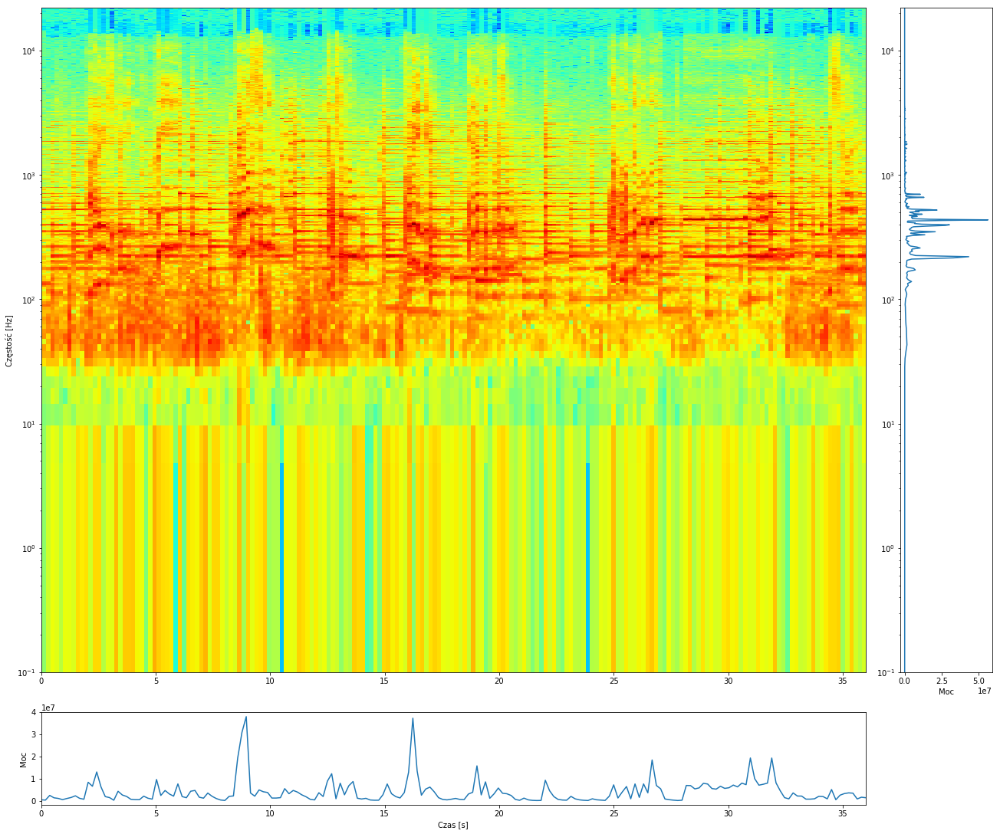

In [140]:
spectrogram(signal1,Fs1,N_okna=8192,N_wsp=1024)

Utwór: 'Lily was here'

Długość okna: 512

Liczba próbek wspólnych: 64

okno: hamming

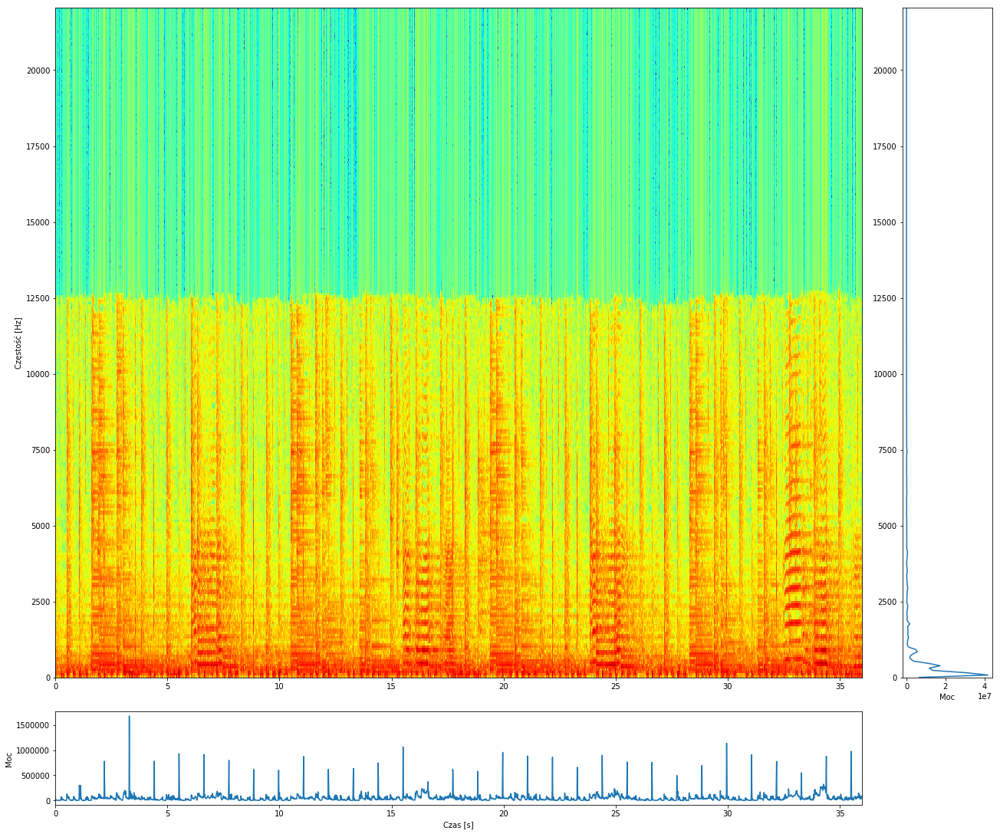

In [8]:
spectrogram(signal2,Fs2,N_okna=512,N_wsp=64)

Utwór: 'Lily was here'

Długość okna: 1024

Liczba próbek wspólnych: 128

okno: hamming

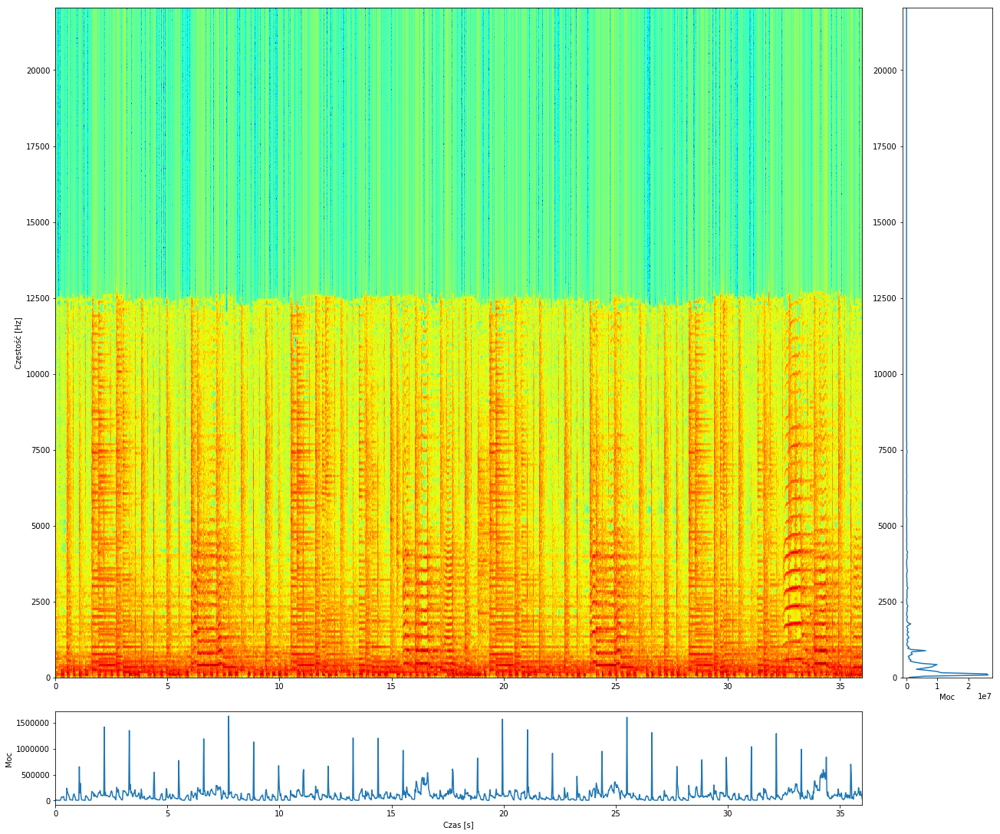

In [9]:
spectrogram(signal2,Fs2,N_okna=1024,N_wsp=128)

Utwór: 'Lily was here'

Długość okna: 2048

Liczba próbek wspólnych: 256

okno: hamming

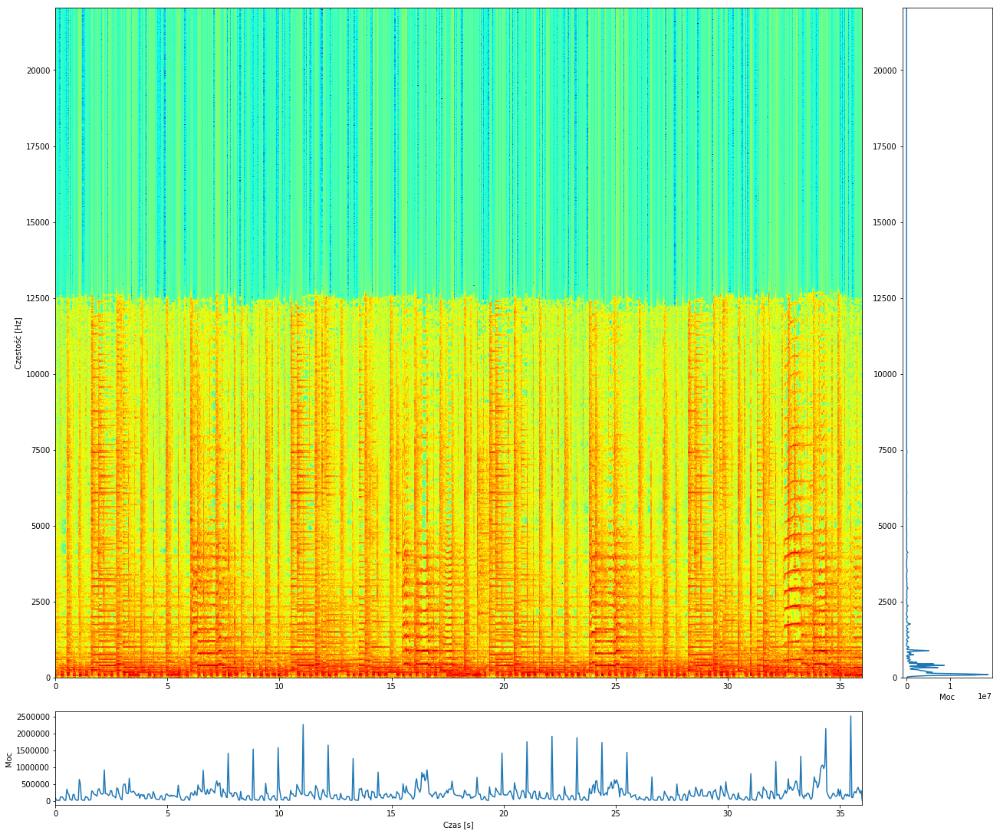

In [10]:
spectrogram(signal2,Fs2,N_okna=2048,N_wsp=256)

Utwór: 'Lily was here'

Długość okna: 4096

Liczba próbek wspólnych: 512

okno: hamming

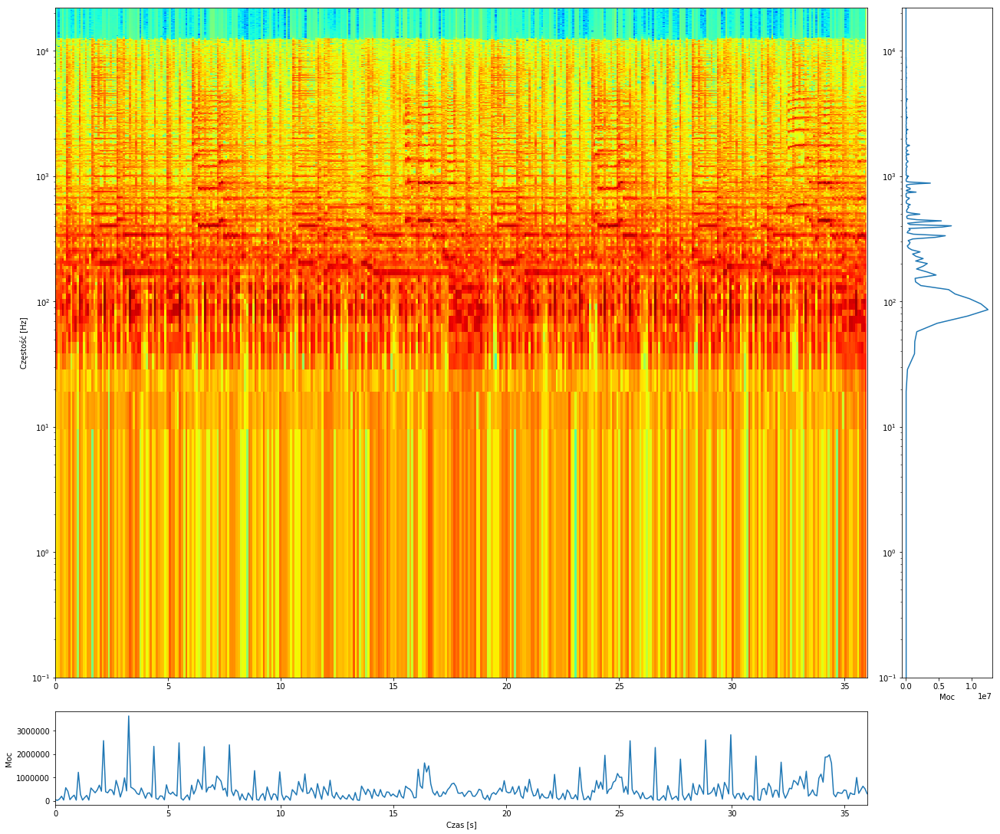

In [139]:
spectrogram(signal2,Fs2,N_okna=4096,N_wsp=512)

Utwór: 'Lily was here'

Długość okna: 8192

Liczba próbek wspólnych: 1024

okno: hamming

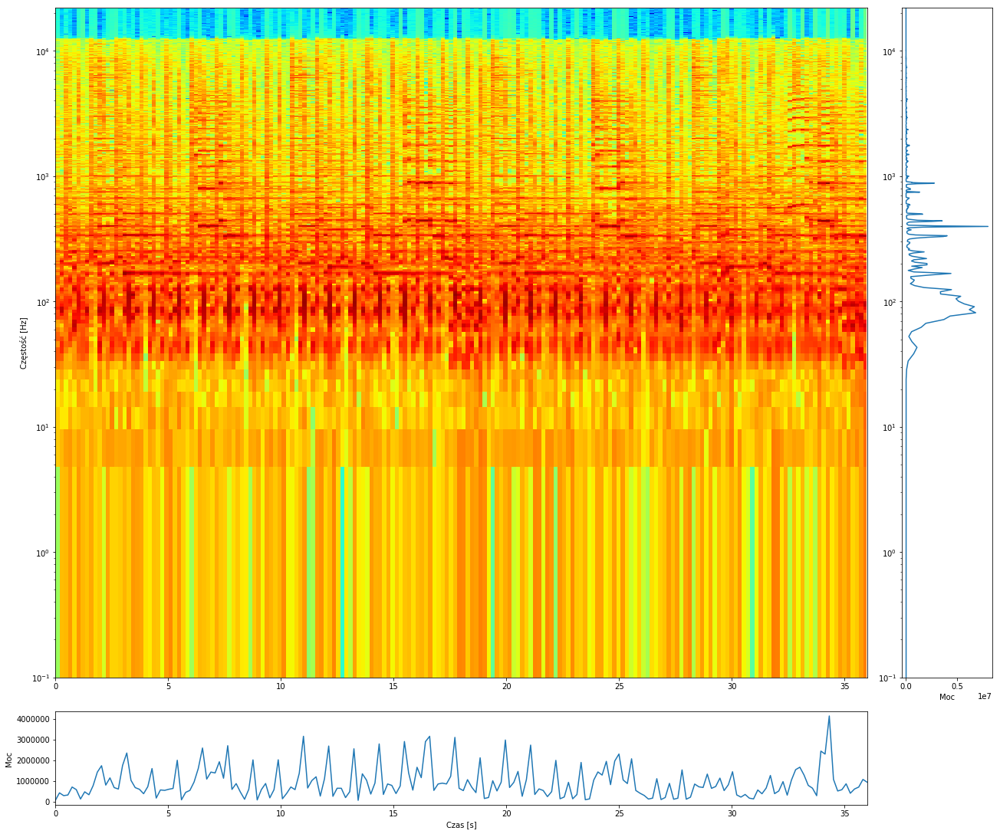

In [142]:
spectrogram(signal2,Fs2,N_okna=8192,N_wsp=1024)

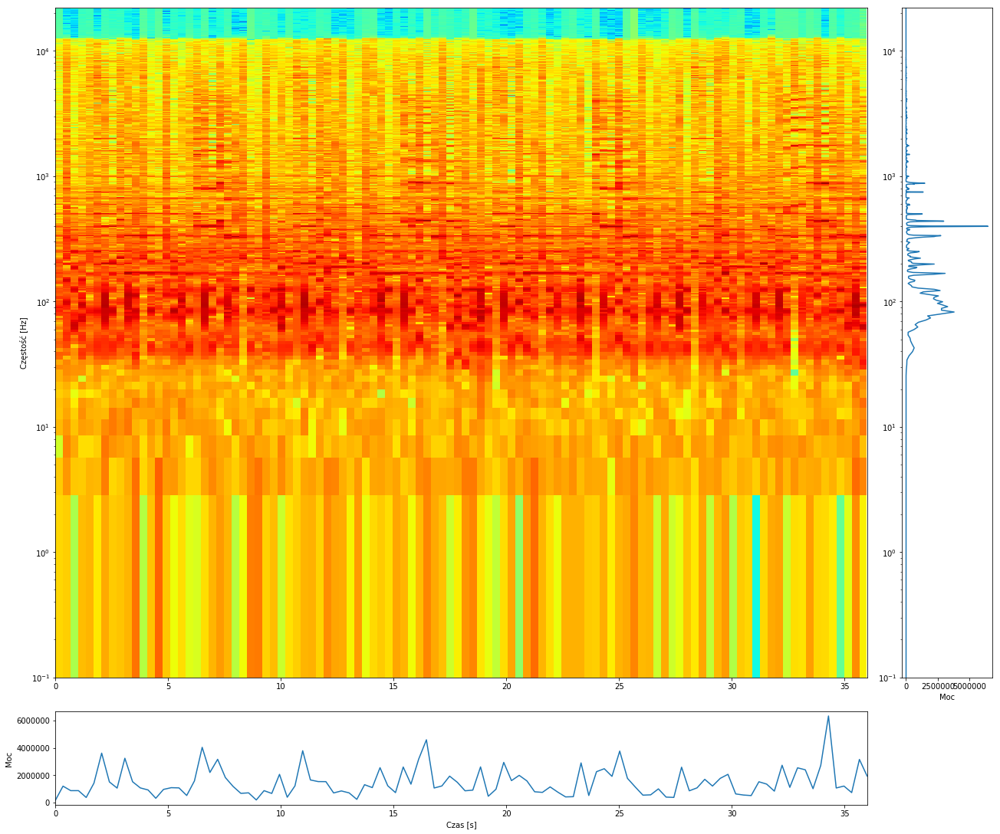

In [144]:
spectrogram(signal2,Fs2,N_okna=15000,N_wsp=512)